In [114]:
from data_reader_writer import * 
import data_process as dp
import itertools as it
import pandas as pd
import numpy as np
from sklearn.cross_decomposition import CCA
from collections import defaultdict
from scipy.stats import pearsonr
from sklearn.model_selection import cross_val_score
import operator
from difflib import SequenceMatcher

from math import ceil

import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline

In [3]:
results_ao_1, results_gb_1 = load_var("all_combinations_best_elecs_1")

In [4]:
results_ao_2, results_gb_2 = load_var("all_combinations_best_elecs_2")

In [44]:
def default_to_regular(d):
    if isinstance(d, defaultdict):
        d = {k: default_to_regular(v) for k, v in d.items()}
    return d

In [55]:
def findsubsets(s, n): 
    return [list(i) for i in it.combinations(s, n)] 

In [56]:
OUTCOME_REGRESSORS = ["loss_ind", "regret", "rpe", "win_ind"]
GAMEBTN_REGRESSORS = ["exputil", "gamble_ind", "risk", "winprob"]

outcome_subsets = [OUTCOME_REGRESSORS] + findsubsets(OUTCOME_REGRESSORS, 2) + findsubsets(OUTCOME_REGRESSORS, 3)
gamebtn_subsets = [GAMEBTN_REGRESSORS] + findsubsets(GAMEBTN_REGRESSORS, 2) + findsubsets(GAMEBTN_REGRESSORS, 3)

In [6]:
results_ao_1[('loss_ind', 'rpe', 'win_ind')].keys()

dict_keys([(1, 'all'), (1, 'best'), (2, 'all'), (2, 'best'), (3, 'all'), (3, 'best')])

In [7]:
results_ao_1[('loss_ind', 'rpe', 'win_ind')][(1, 'all')].keys()

dict_keys(['Y_features', 'nr', 's1', 's2', 's3', 's4', 's5', 's6', 's7', 's8', 's9', 's10'])

In [8]:
results_gb_2.keys()

dict_keys([('exputil', 'gamble_ind', 'risk', 'winprob'), ('exputil', 'gamble_ind'), ('exputil', 'risk'), ('exputil', 'winprob'), ('gamble_ind', 'risk'), ('gamble_ind', 'winprob'), ('risk', 'winprob'), ('exputil', 'gamble_ind', 'risk'), ('exputil', 'gamble_ind', 'winprob'), ('exputil', 'risk', 'winprob'), ('gamble_ind', 'risk', 'winprob')])

In [9]:
results_gb_2[('gamble_ind', 'risk')].keys()

dict_keys([(1, 'all', 0.2), (1, 'best', 0.2), (1, 'all', 0.4), (1, 'best', 0.4), (1, 'all', 0.6), (1, 'best', 0.6), (1, 'all', 0.8), (1, 'best', 0.8), (1, 'all', 1.0), (1, 'best', 1.0), (2, 'all', 0.2), (2, 'best', 0.2), (2, 'all', 0.4), (2, 'best', 0.4), (2, 'all', 0.6), (2, 'best', 0.6), (2, 'all', 0.8), (2, 'best', 0.8), (2, 'all', 1.0), (2, 'best', 1.0), (3, 'all', 0.2), (3, 'best', 0.2), (3, 'all', 0.4), (3, 'best', 0.4), (3, 'all', 0.6), (3, 'best', 0.6), (3, 'all', 0.8), (3, 'best', 0.8), (3, 'all', 1.0), (3, 'best', 1.0)])

In [10]:
results_gb_2[('gamble_ind', 'risk')][(1, 'best', 0.2)].keys()

dict_keys(['Y_features', 'nr', 's1', 's2', 's3', 's4', 's5', 's6', 's7', 's8', 's9', 's10'])

In [26]:
results_gb_2[('gamble_ind', 'risk')][(1, 'best', 0.2)]['s1'].keys()

dict_keys(['a', 'b', 'coef', 'cross_val'])

In [27]:
results_gb_2[('gamble_ind', 'risk')][(1, 'best', 0.2)]['s1']['cross_val'].keys()

dict_keys(['test_corrs', 'train_corrs', 'x_weights', 'y_weights', 'sums_X_test', 'sums_Y_test', 'sums_X_train', 'sums_Y_train'])

In [149]:
def sort_all():
    results_all = defaultdict(tuple)
    for results in [results_ao_1, results_gb_1, results_ao_2, results_gb_2]:
        for combo in results:
            for params in results[combo]:
                res = results[combo][params]
                for s in SUBJECTS:
                    avg_test_corr = np.array(res[s]["cross_val"]["test_corrs"]).mean()
                    avg_train_corr = np.array(res[s]["cross_val"]["train_corrs"]).mean()
                    
                    results_all[(combo, params, s)] = (avg_train_corr, avg_test_corr)
    
    results_all = default_to_regular(results_all)
    return sorted(results_all.items(), key=lambda x: x[1][1], reverse=True) # sort by avg_test_corr

In [150]:
sort_all()[:10]

[((('loss_ind', 'win_ind'), (3, 'best', 0.6), 's8'),
  (0.5530196240016253, 0.4024317944271251)),
 ((('risk', 'winprob'), (2, 'best', 0.6), 's1'),
  (0.4089404193035229, 0.3949476365709142)),
 ((('risk', 'winprob'), (2, 'best', 0.4), 's1'),
  (0.418913320814659, 0.3904041017329267)),
 ((('loss_ind', 'win_ind'), (2, 'best', 0.8), 's8'),
  (0.523609348419045, 0.3884726370929909)),
 ((('loss_ind', 'win_ind'), (2, 'best', 0.6), 's8'),
  (0.49140812446958354, 0.37744182878074006)),
 ((('risk', 'winprob'), (2, 'best', 0.8), 's1'),
  (0.41177025525257027, 0.36993624234004335)),
 ((('loss_ind', 'regret', 'win_ind'), (3, 'best'), 's5'),
  (0.43244222932693893, 0.367972544445045)),
 ((('loss_ind', 'win_ind'), (3, 'best', 0.4), 's8'),
  (0.4807650822093999, 0.3672047103037771)),
 ((('loss_ind', 'win_ind'), (3, 'best', 0.8), 's8'),
  (0.574499698985637, 0.3664569836912129)),
 ((('risk', 'winprob'), (3, 'best', 0.2), 's5'),
  (0.5913033979139918, 0.361509593157834))]

In [151]:
results_ao_2[('loss_ind', 'win_ind')][(3, 'best', 0.6)]['s8'].keys()

dict_keys(['a', 'b', 'coef', 'cross_val'])

In [152]:
def plot_weighted_sums(s, results, plot_title=None):
    if type(results) == list:
        
        fig, axes = plt.subplots(len(results), 2, figsize=(5, 3 * len(results)))
        fig.tight_layout(pad=1.0, w_pad=2.0, h_pad=3.0)  # to make room for titles and feature names
        axes = axes.flatten()
        for i in range(len(results)):
            test_data = pd.DataFrame({"sums_X_test": results[i][s]["cross_val"]["sums_X_test"], 
                                "sums_Y_test": results[i][s]["cross_val"]["sums_Y_test"]})
            train_data = pd.DataFrame({"sums_X_train": results[i][s]["cross_val"]["sums_X_train"],
                                "sums_Y_train": results[i][s]["cross_val"]["sums_Y_train"]}) 
            sns.scatterplot(x="sums_X_test", y="sums_Y_test", data=test_data, ax=axes[i * 2]).set(
                xlabel="X test sums", ylabel="Y test sums", title="Test, %s, results %d" % (s, results[i]["nr"]))
            sns.scatterplot(x="sums_X_train", y="sums_Y_train", data=train_data, ax=axes[i * 2 + 1]).set(
                xlabel="X train sums", ylabel="Y train sums", title="Train, %s, results %d" % (s, results[i]["nr"]))
        
    elif type(results) == dict or type(results) == defaultdict:
        fig, axes = plt.subplots(1,2, figsize=(10.0, 4.0))
        test_data = pd.DataFrame({"sums_X_test": results[s]["cross_val"]["sums_X_test"], 
                            "sums_Y_test": results[s]["cross_val"]["sums_Y_test"]})
        train_data = pd.DataFrame({"sums_X_train": results[s]["cross_val"]["sums_X_train"],
                            "sums_Y_train": results[s]["cross_val"]["sums_Y_train"]}) 
        ax1 = sns.scatterplot(x="sums_X_test", y="sums_Y_test", data=test_data, ax=axes[0])
        ax2 = sns.scatterplot(x="sums_X_train", y="sums_Y_train", data=train_data, ax=axes[1])
        ax1.set(xlabel="X test sums", ylabel="Y test sums", title="Test, %s, results %d" % (s, results["nr"]))
        ax2.set(xlabel="X train sums", ylabel="Y train sums", title="Train, %s, results %d" % (s, results["nr"]))
    
    if plot_title != None:
        save_fig(fig, plot_title)


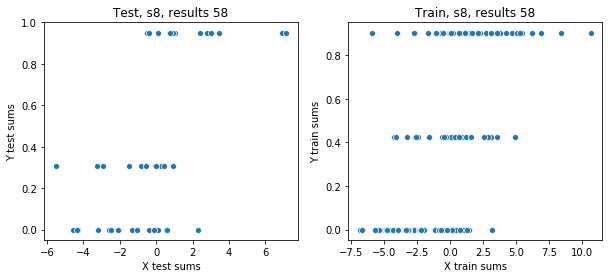

In [153]:
plot_weighted_sums('s8', results_ao_2[('loss_ind', 'win_ind')][(3, 'best', 0.6)])

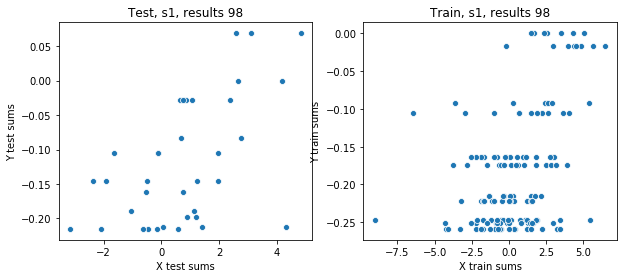

In [154]:
plot_weighted_sums('s1', results_gb_2[('risk', 'winprob')][(2, 'best', 0.6)])

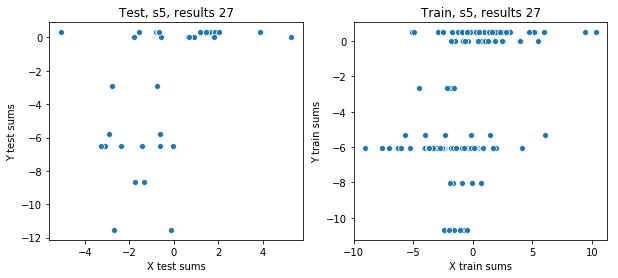

In [155]:
plot_weighted_sums('s5', results_ao_1[('loss_ind', 'regret', 'win_ind')][(3, 'best')])

In [11]:
def fix_labels(axes, angle=90):
    for ax in axes:
        for label in ax.get_xticklabels():
            label.set_rotation(angle)

In [22]:
def plot_general_corr_results(results, subjects=SUBJECTS, plot_title=None):
    n_res = len(results)
    n_sub = len(subjects)
    avg_res_test_corrs = np.repeat(0.0, n_res)
    avg_res_train_corrs = np.repeat(0.0, n_res)
    avg_s_test_corrs = np.repeat(0.0, n_sub)
    avg_s_train_corrs = np.repeat(0.0, n_sub)
    
    for i in range(n_res):
        res = results[i][1]
        params = results[i][0]
        
        for j in range(n_sub):
            s = subjects[j]
            avg_test_corr = np.array(res[s]["cross_val"]["test_corrs"]).mean()
            avg_train_corr = np.array(res[s]["cross_val"]["train_corrs"]).mean()
            
            avg_res_test_corrs[i] += avg_test_corr
            avg_res_train_corrs[i] += avg_train_corr
            
            avg_s_test_corrs[j] += avg_test_corr
            avg_s_train_corrs[j] += avg_train_corr
    
    avg_res_test_corrs /= n_sub
    avg_res_train_corrs /= n_sub
    avg_s_test_corrs /= n_res
    avg_s_train_corrs /= n_res
    
    fig, axes = plt.subplots(1, 2, figsize=(20, 7))
    axes = axes.flatten()
    
    # First plot
    data1 = pd.DataFrame({"subject": subjects + subjects, "corr": np.append(avg_s_test_corrs, avg_s_train_corrs), 
                         "type": np.append(np.repeat("test", n_sub), np.repeat("train", n_sub))})
    sns.pointplot(x="subject", y="corr", hue="type", data=data1, dodge=True, ax=axes[0]).set(
        title="Avg test and train corr per subject")

    # Second plot
#     res_labels = ["res" + str(i) for i in range(1, n_res + 1)]
    res_labels = [results[i][0] for i in range(n_res)]
    data2 = pd.DataFrame({"result": res_labels + res_labels, "corr": np.append(avg_res_test_corrs, avg_res_train_corrs),
                         "type": np.append(np.repeat("test", n_res), np.repeat("train", n_res))})
    sns.pointplot(x="result", y="corr", hue="type", data=data2, dodge=True, ax=axes[1]).set(
        title="Avg test and train corr per result")

    fix_labels(axes)
    
    if plot_title != None:
        save_fig(fig, plot_title)

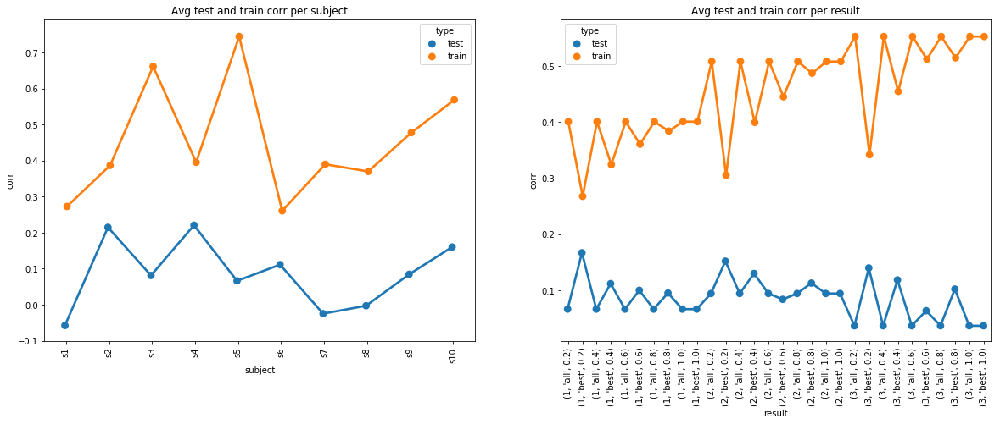

In [25]:
plot_general_corr_results(list(results_ao_2[('regret', 'rpe')].items()))

In [61]:
param_dict_1 = {'tw_per_el': [1, 2, 3], 'electrodes': ['best', 'all']}
param_dict_2 = {'tw_per_el': [1, 2, 3], 'electrodes': ['best', 'all'], 'percent': [0.2, 0.4, 0.6, 0.8, 1]}

In [102]:
def calculate_param_avg_for_regressor_combo(results):
    # keys: param_results[param_name][param_value][subject][train/test] = avg_corr
    param_results = defaultdict(lambda: defaultdict(lambda: defaultdict(lambda: defaultdict(float))))
    param_counts = defaultdict(lambda: defaultdict(int))
    
    n_res = len(results)
    for i in range(n_res):
        params = results[i][0]
        res = results[i][1]
        
        tw_per_el = None
        elecs = None
        percent = None
        if len(params) == 3:
            tw_per_el, elecs, percent = params
        else: 
            tw_per_el, elecs = params
            
        for s in SUBJECTS:
            avg_train_corr = np.array(res[s]["cross_val"]["train_corrs"]).mean()
            avg_test_corr = np.array(res[s]["cross_val"]["test_corrs"]).mean()

            param_results['tw_per_el'][tw_per_el][s]["train"] += avg_train_corr
            param_results['tw_per_el'][tw_per_el][s]["test"] += avg_test_corr
            param_results['elecs'][elecs][s]["train"] += avg_train_corr
            param_results['elecs'][elecs][s]["test"] += avg_test_corr
            
            if percent is not None:
                param_results['percent'][percent][s]["train"] += avg_train_corr
                param_results['percent'][percent][s]["test"] += avg_test_corr    

        param_counts['tw_per_el'][tw_per_el] += 1
        param_counts['elecs'][elecs] += 1
        param_counts['percent'][percent] += 1
           
    
    for param_name in param_results:
        for param_val in param_results[param_name]:
            for s in SUBJECTS:
                param_results[param_name][param_val][s]["train"] /= param_counts[param_name][param_val]
                param_results[param_name][param_val][s]["test"] /= param_counts[param_name][param_val]
    
    return param_results

In [103]:
params_regret_rpe = calculate_param_avg_for_regressor_combo(list(results_ao_2[('regret', 'rpe')].items()))

In [104]:
def pretty_print_param_avgs(param_results):
    for param_name in param_results:
        print(param_name)
        for param_val in param_results[param_name]:
            print('\t', param_val)

            for it in default_to_regular(param_results[param_name][param_val]).items():
                print('\t', it)

In [105]:
pretty_print_param_avgs(params_regret_rpe)

tw_per_el
	 1
	 ('s1', {'train': 0.19484343093490725, 'test': -0.15997530371597868})
	 ('s2', {'train': 0.3286067106844654, 'test': 0.2251796656011976})
	 ('s3', {'train': 0.54794579190347, 'test': 0.06279288290185041})
	 ('s4', {'train': 0.3569466533047484, 'test': 0.29679763766329514})
	 ('s5', {'train': 0.6462485123643097, 'test': 0.07950641749375172})
	 ('s6', {'train': 0.22572162906895926, 'test': 0.17767123449161618})
	 ('s7', {'train': 0.32196294827363586, 'test': 0.012677028031789928})
	 ('s8', {'train': 0.2848137947250966, 'test': -0.09790270380957918})
	 ('s9', {'train': 0.3803100306089723, 'test': 0.12801327737814677})
	 ('s10', {'train': 0.45603544538556073, 'test': 0.14628099533351738})
	 2
	 ('s1', {'train': 0.30237227810348977, 'test': 0.03203767451223749})
	 ('s2', {'train': 0.3950211488810956, 'test': 0.21923741210636177})
	 ('s3', {'train': 0.7443175602256493, 'test': 0.15461237206938258})
	 ('s4', {'train': 0.37679544972565215, 'test': 0.2138662687923533})
	 ('s5', {

In [110]:
param_avgs_results_ao_1 = []
for combo in outcome_subsets:
    print(combo)
    param_res = calculate_param_avg_for_regressor_combo(list(results_ao_1[tuple(combo)].items()))
    param_avgs_results_ao_1.append(param_res)
    pretty_print_param_avgs(param_res)

['loss_ind', 'regret', 'rpe', 'win_ind']
tw_per_el
	 1
	 ('s1', {'train': 0.0972274671973099, 'test': -0.09788896353420865})
	 ('s2', {'train': 0.2885454315432332, 'test': 0.23091991355195213})
	 ('s3', {'train': 0.2397210529170044, 'test': 0.07415895738140924})
	 ('s4', {'train': 0.2908489514966221, 'test': 0.1873766546448336})
	 ('s5', {'train': 0.3775871254929932, 'test': 0.05819810597831575})
	 ('s6', {'train': 0.19824255868837898, 'test': 0.1447820472151281})
	 ('s7', {'train': -0.08031280088598503, 'test': -0.09085107534872994})
	 ('s8', {'train': 0.15082578246299, 'test': -0.08258899958528394})
	 ('s9', {'train': 0.013495857778197187, 'test': -0.08463499138448562})
	 ('s10', {'train': 0.22223980973292667, 'test': -0.010164842276184964})
	 2
	 ('s1', {'train': 0.2145697467823999, 'test': -0.045489606352725726})
	 ('s2', {'train': 0.336971388666498, 'test': 0.21493742131864021})
	 ('s3', {'train': 0.21902417383553363, 'test': -0.007899429671453649})
	 ('s4', {'train': 0.2577553885

	 ('s7', {'train': 0.08282940168538186, 'test': -0.031619041741589825})
	 ('s8', {'train': 0.34809950306621973, 'test': 0.14911649120220855})
	 ('s9', {'train': 0.33139757170585155, 'test': 0.0019262971859744821})
	 ('s10', {'train': 0.5248499619271434, 'test': 0.1743460380239051})
	 best
	 ('s1', {'train': 0.12766980055322483, 'test': -0.06917661633379724})
	 ('s2', {'train': 0.35477847524567, 'test': 0.2623985683224694})
	 ('s3', {'train': 0.2545860260585317, 'test': 0.1754835440440369})
	 ('s4', {'train': 0.17234118971715162, 'test': 0.07294882892651308})
	 ('s5', {'train': 0.37680003735110845, 'test': 0.32634352063823635})
	 ('s6', {'train': 0.17184018694365322, 'test': 0.07215730116320523})
	 ('s7', {'train': 0.14066194222299744, 'test': -0.08858317174634951})
	 ('s8', {'train': 0.19544860079971318, 'test': -0.022771596921107917})
	 ('s9', {'train': 0.24589459079206577, 'test': 0.0180958994409554})
	 ('s10', {'train': 0.12639087377672323, 'test': -0.031598390906884655})
['loss_ind

In [133]:
# results is a list of dictionaries gotten from calculate_param_avg_for_regressor_combo()
def plot_param_avgs_for_subject(subsets, results, param_name, plot_title=None):
    n_res = len(results)
    n_sub = 10
    n_rows = n_res
    fig, axes = plt.subplots(n_rows, 2, figsize=(20, n_rows * 5))
    axes = axes.flatten()
    
    ax_idx = 0
    for combo in subsets:
        param_res = calculate_param_avg_for_regressor_combo(list(results[tuple(combo)].items()))

        if param_name == 'tw_per_el':
            tw_per_el_123_train = {1: np.zeros(n_sub), 2: np.zeros(n_sub), 3: np.zeros(n_sub)}
            tw_per_el_123_test = {1: np.zeros(n_sub), 2: np.zeros(n_sub), 3: np.zeros(n_sub)}

            for param_val in param_res[param_name]:
                for i in range(len(SUBJECTS)):
                    tw_per_el_123_train[param_val][i] = param_res[param_name][param_val][SUBJECTS[i]]["train"]
                    tw_per_el_123_test[param_val][i] = param_res[param_name][param_val][SUBJECTS[i]]["test"]
                
            data1 = pd.DataFrame({"subject": np.tile(SUBJECTS, 3), "corr": np.array([tw_per_el_123_train[1], 
                                                                                    tw_per_el_123_train[2],
                                                                                    tw_per_el_123_train[3]]).flatten(),
                                 "value": np.array([np.repeat(1, n_sub), np.repeat(2, n_sub), np.repeat(3, n_sub)]).flatten()})
            sns.pointplot(x="subject", y="corr", hue="value", data=data1, dodge=True, ax=axes[ax_idx * 2]).set(
                title="Combo %s, avg train corr per subject" % str(combo), xlabel="")
            
            data2 = pd.DataFrame({"subject": np.tile(SUBJECTS, 3), "corr": np.array([tw_per_el_123_test[1],
                                                                                     tw_per_el_123_test[2],
                                                                                     tw_per_el_123_test[3]]).flatten(),
                                 "value": np.array([np.repeat(1, n_sub), np.repeat(2, n_sub), np.repeat(3, n_sub)]).flatten()})
            sns.pointplot(x="subject", y="corr", hue="value", data=data2, dodge=True, ax=axes[ax_idx * 2 + 1]).set(
                title="Combo %s, avg test corr per subject" % str(combo), xlabel="")

            ax_idx += 1

        elif param_name == 'elecs':
            elecs_best_all_train = {'best': np.zeros(n_sub), 'all': np.zeros(n_sub)}
            elecs_best_all_test = {'best': np.zeros(n_sub), 'all': np.zeros(n_sub)}
            
            for param_val in param_res[param_name]:
                for i in range(len(SUBJECTS)):
                    elecs_best_all_train[param_val][i] = param_res[param_name][param_val][SUBJECTS[i]]["train"]
                    elecs_best_all_test[param_val][i] = param_res[param_name][param_val][SUBJECTS[i]]["test"]
                
            data1 = pd.DataFrame({"subject": np.tile(SUBJECTS, 2), "corr": np.array([elecs_best_all_train['best'], 
                                                                                    elecs_best_all_train['all']]).flatten(),
                                 "value": np.array([np.repeat('best', n_sub), np.repeat('all', n_sub)]).flatten()})
            sns.pointplot(x="subject", y="corr", hue="value", data=data1, dodge=True, ax=axes[ax_idx * 2]).set(
                title="Combo %s, avg train corr per subject" % str(combo), xlabel="")
            
            data2 = pd.DataFrame({"subject": np.tile(SUBJECTS, 2), "corr": np.array([elecs_best_all_test['best'], 
                                                                                    elecs_best_all_test['all']]).flatten(),
                                 "value": np.array([np.repeat('best', n_sub), np.repeat('all', n_sub)]).flatten()})
            sns.pointplot(x="subject", y="corr", hue="value", data=data2, dodge=True, ax=axes[ax_idx * 2 + 1]).set(
                title="Combo %s, avg test corr per subject" % str(combo), xlabel="")

            ax_idx += 1

            
        elif param_name == 'percent':
            percents_train = {0.2: np.zeros(n_sub), 0.4: np.zeros(n_sub), 0.6: np.zeros(n_sub), 0.8: np.zeros(n_sub), 
                        1.0: np.zeros(n_sub)}
            
            percents_test = {0.2: np.zeros(n_sub), 0.4: np.zeros(n_sub), 0.6: np.zeros(n_sub), 0.8: np.zeros(n_sub), 
                        1.0: np.zeros(n_sub)}
            
            
            for param_val in param_res[param_name]:
                for i in range(len(SUBJECTS)):
                    percents_train[param_val][i] = param_res[param_name][param_val][SUBJECTS[i]]["train"]
                    percents_test[param_val][i] = param_res[param_name][param_val][SUBJECTS[i]]["test"]
                
            data1 = pd.DataFrame({"subject": np.tile(SUBJECTS, 5), "corr": np.array([percents_train[0.2], percents_train[0.4], 
                                                                                     percents_train[0.6], percents_train[0.8],
                                                                                     percents_train[1.0]]).flatten(),
                                 "value": np.array([np.repeat(0.2, n_sub), np.repeat(0.4, n_sub), np.repeat(0.6, n_sub),
                                                    np.repeat(0.8, n_sub), np.repeat(1.0, n_sub)]).flatten()})
            sns.pointplot(x="subject", y="corr", hue="value", data=data1, dodge=True, ax=axes[ax_idx * 2]).set(
                title="Combo %s, avg train corr per subject" % str(combo), xlabel="")
            
            data2 = pd.DataFrame({"subject": np.tile(SUBJECTS, 5), "corr": np.array([percents_test[0.2], percents_test[0.4], 
                                                                                     percents_test[0.6], percents_test[0.8],
                                                                                     percents_test[1.0]]).flatten(),
                                 "value": np.array([np.repeat(0.2, n_sub), np.repeat(0.4, n_sub), np.repeat(0.6, n_sub),
                                                    np.repeat(0.8, n_sub), np.repeat(1.0, n_sub)]).flatten()})
            sns.pointplot(x="subject", y="corr", hue="value", data=data2, dodge=True, ax=axes[ax_idx * 2 + 1]).set(
                title="Combo %s, avg test corr per subject" % str(combo), xlabel="")

            ax_idx += 1
            
    fix_labels(axes)

    if plot_title != None:
        save_fig(fig, plot_title)        
    

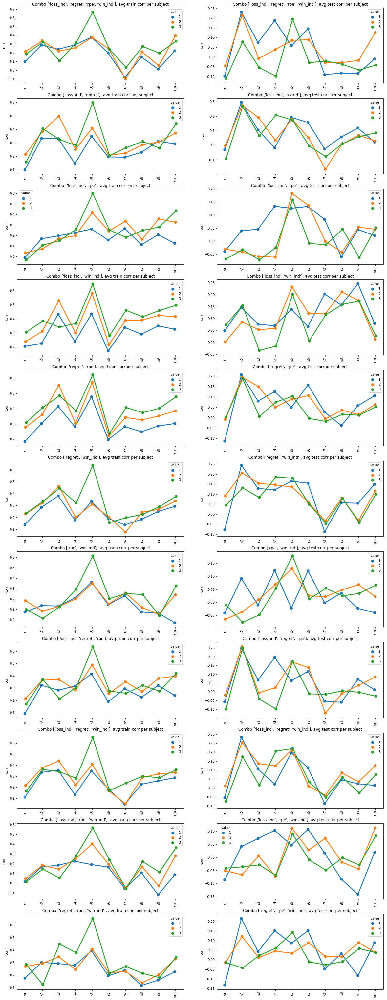

In [128]:
plot_param_avgs_for_subject(outcome_subsets, results_ao_1, 'tw_per_el')

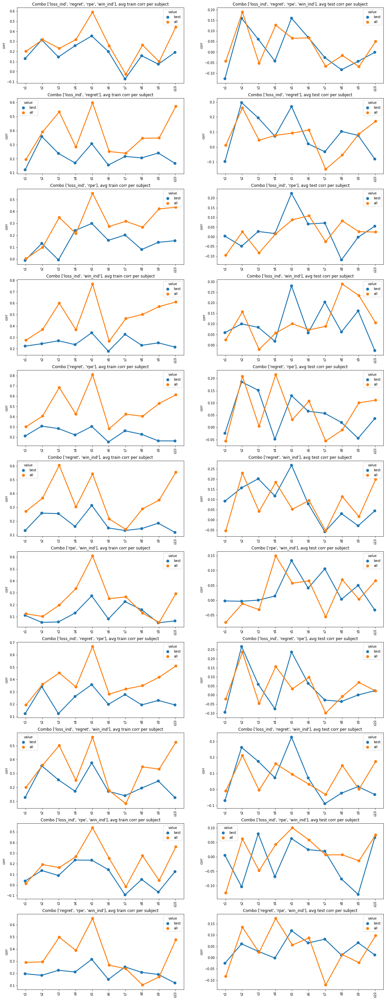

In [132]:
plot_param_avgs_for_subject(outcome_subsets, results_ao_1, 'elecs')

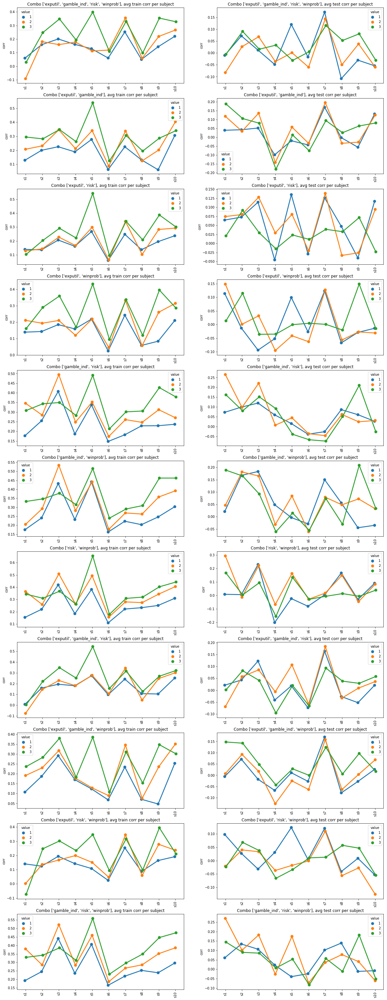

In [136]:
plot_param_avgs_for_subject(gamebtn_subsets, results_gb_1, 'tw_per_el')

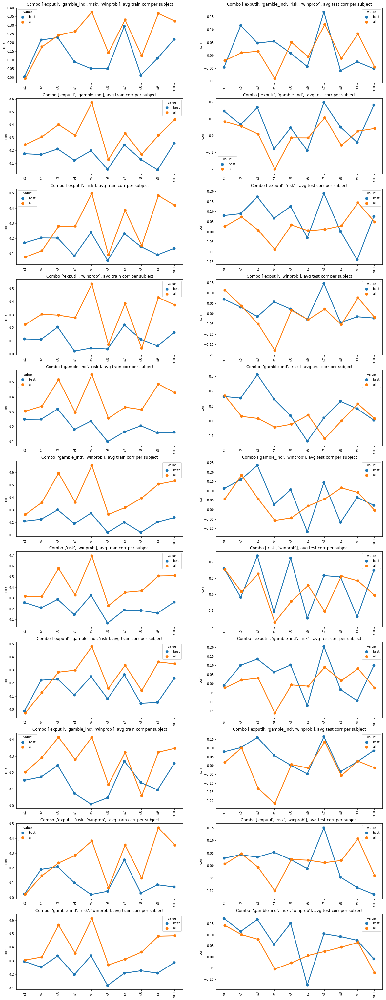

In [137]:
plot_param_avgs_for_subject(gamebtn_subsets, results_gb_1, 'elecs')

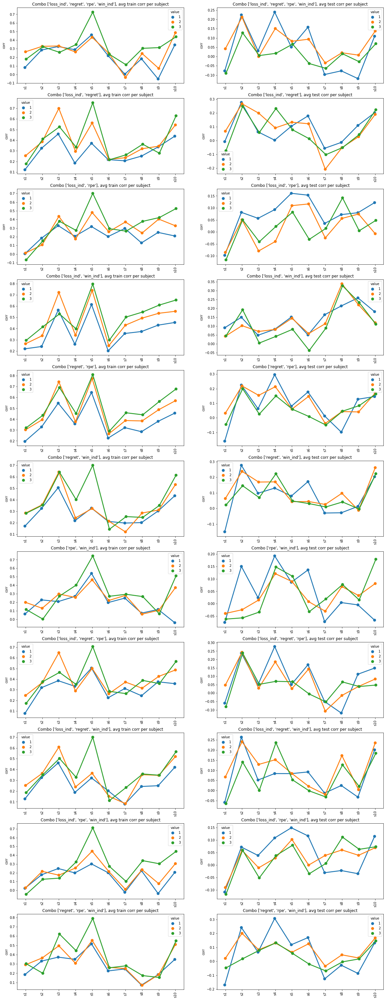

In [138]:
plot_param_avgs_for_subject(outcome_subsets, results_ao_2, 'tw_per_el')

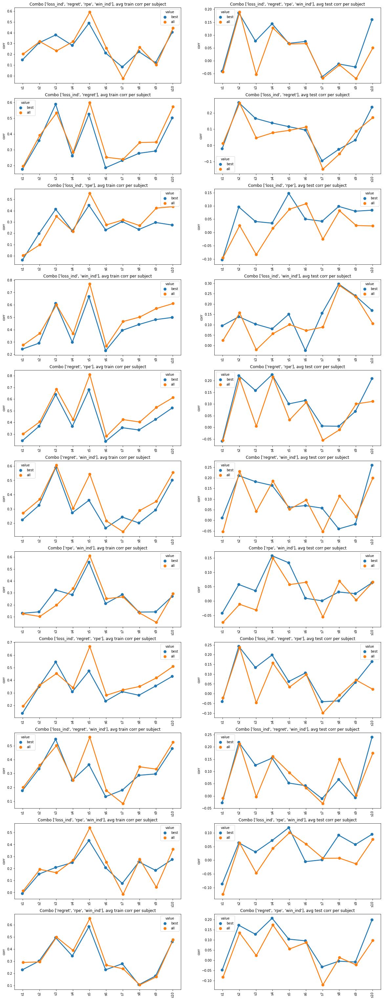

In [139]:
plot_param_avgs_for_subject(outcome_subsets, results_ao_2, 'elecs')

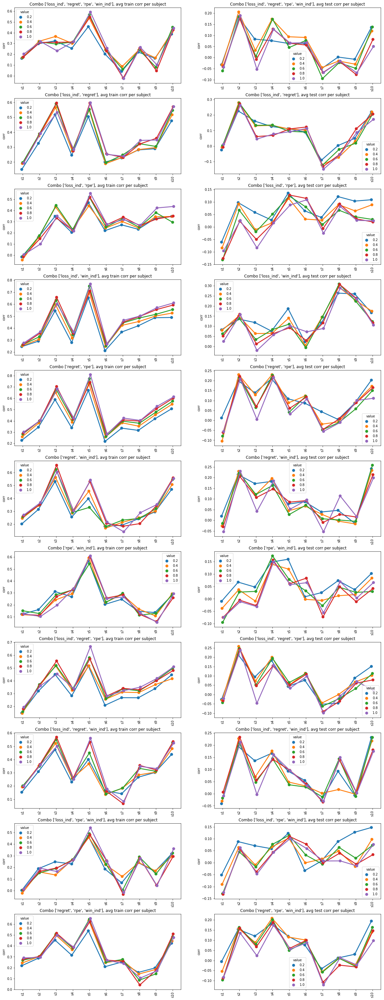

In [134]:
plot_param_avgs_for_subject(outcome_subsets, results_ao_2, 'percent')

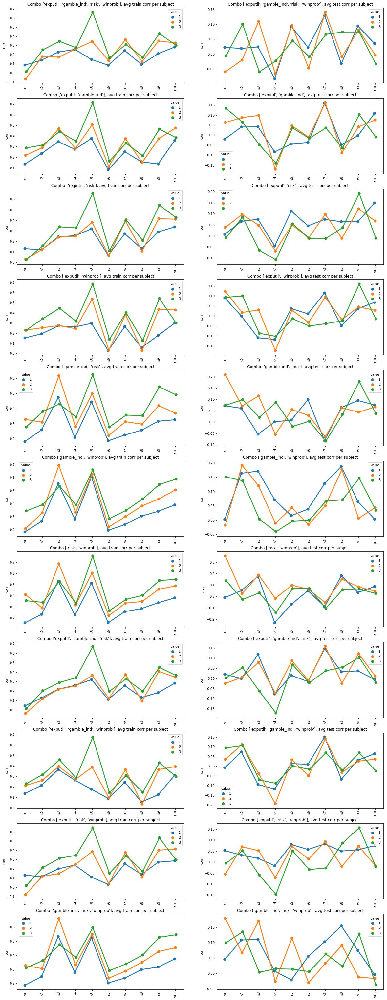

In [143]:
plot_param_avgs_for_subject(gamebtn_subsets, results_gb_2, 'tw_per_el')

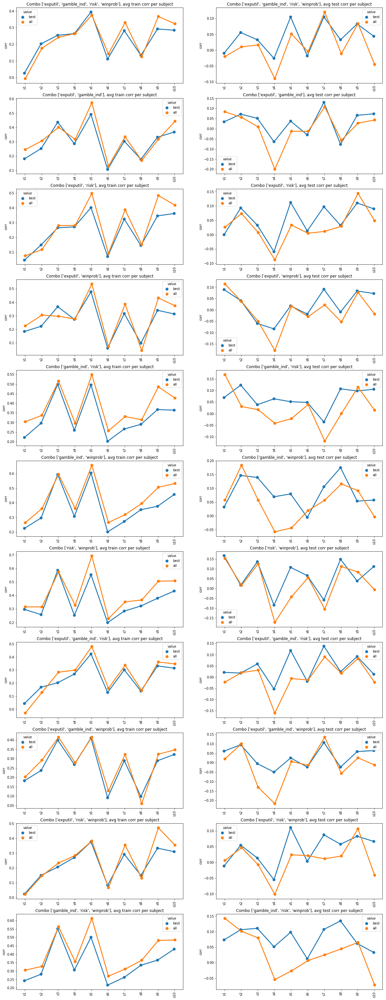

In [144]:
plot_param_avgs_for_subject(gamebtn_subsets, results_gb_2, 'elecs')

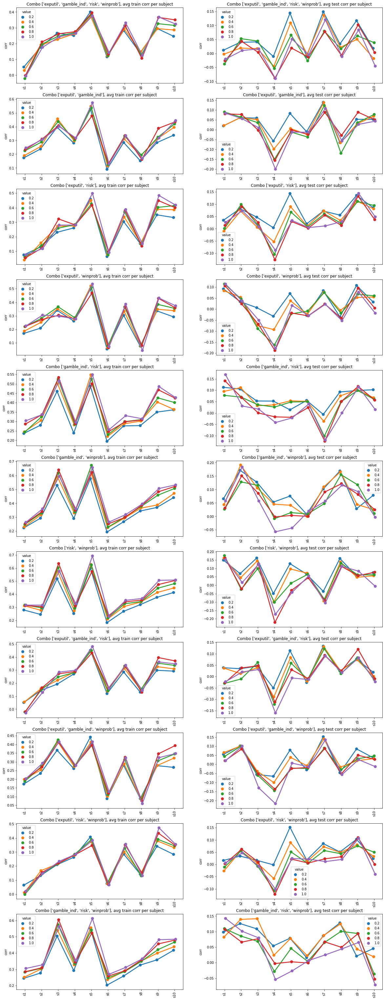

In [145]:
plot_param_avgs_for_subject(gamebtn_subsets, results_gb_2, 'percent')

In [97]:
def plot_combo_avgs_for_subject(results, plot_title=None):
    n_res = len(results)
    fig, axes = plt.subplots(5, 2, figsize=(20, 7 * 5))
    fig.tight_layout(pad=3.0, w_pad=3.0, h_pad=20.0)  # to make room for titles and feature names
    axes = axes.flatten()
    
    ax_idx = 0
    for s in SUBJECTS:
        i = 0
        train_corrs = np.zeros(n_res)
        test_corrs = np.zeros(n_res)
        combos = []
        
        for combo in results:
            combos.append(combo)

            for params in results[combo]:
                res = results[combo][params]
                avg_train_corr = np.array(res[s]["cross_val"]["train_corrs"]).mean()
                avg_test_corr = np.array(res[s]["cross_val"]["test_corrs"]).mean()

                train_corrs[i] += avg_train_corr
                test_corrs[i] += avg_test_corr

            n_params = len(list(results[combo].keys()))
            train_corrs[i] /= n_params
            test_corrs[i] /= n_params
            i += 1

        data = pd.DataFrame({"experiment": combos + combos, "corr": np.append(test_corrs, train_corrs),
                             "type": np.append(np.repeat("test", n_res), np.repeat("train", n_res))})
        sns.pointplot(x="experiment", y="corr", hue="type", data=data, dodge=True, ax=axes[ax_idx]).set(
            title="Subject %s, avg test and train corr per experiment" % s, xlabel="")

        ax_idx += 1
        
    fix_labels(axes)

    if plot_title != None:
        save_fig(fig, plot_title)


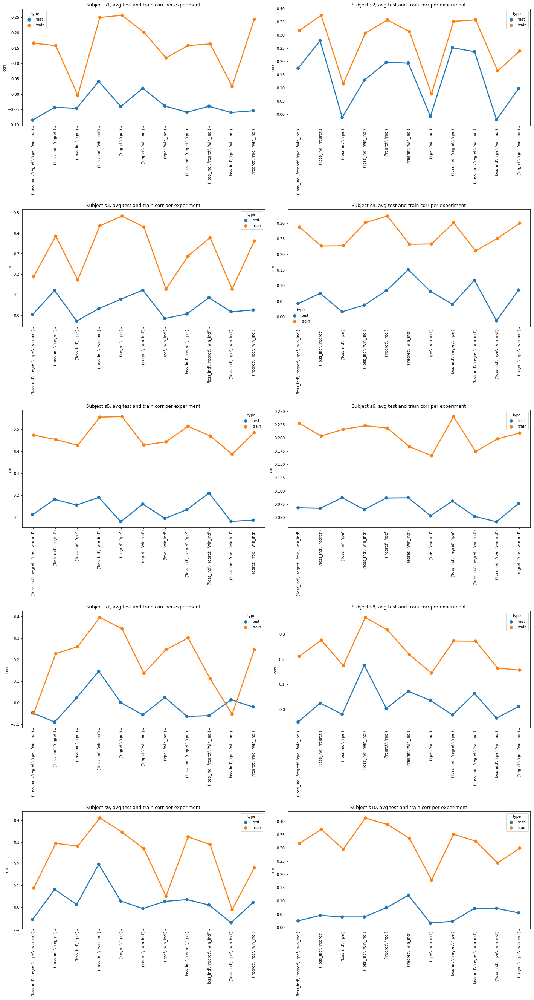

In [98]:
plot_combo_avgs_for_subject(results_ao_1)

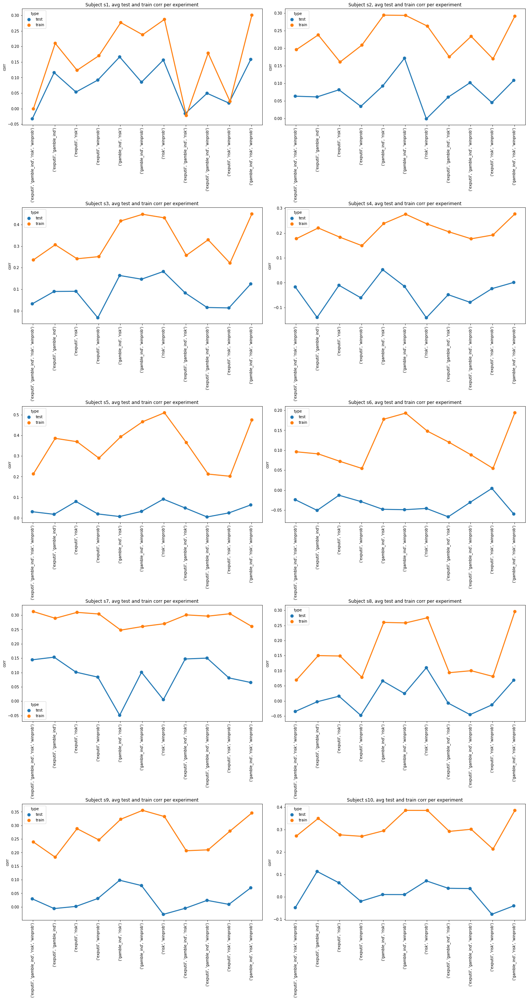

In [99]:
plot_combo_avgs_for_subject(results_gb_1)

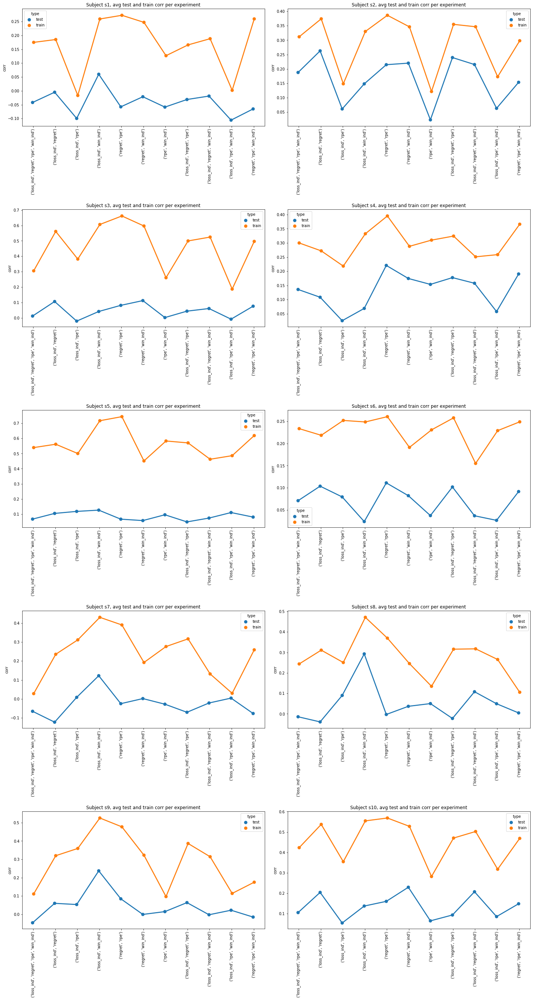

In [100]:
plot_combo_avgs_for_subject(results_ao_2)

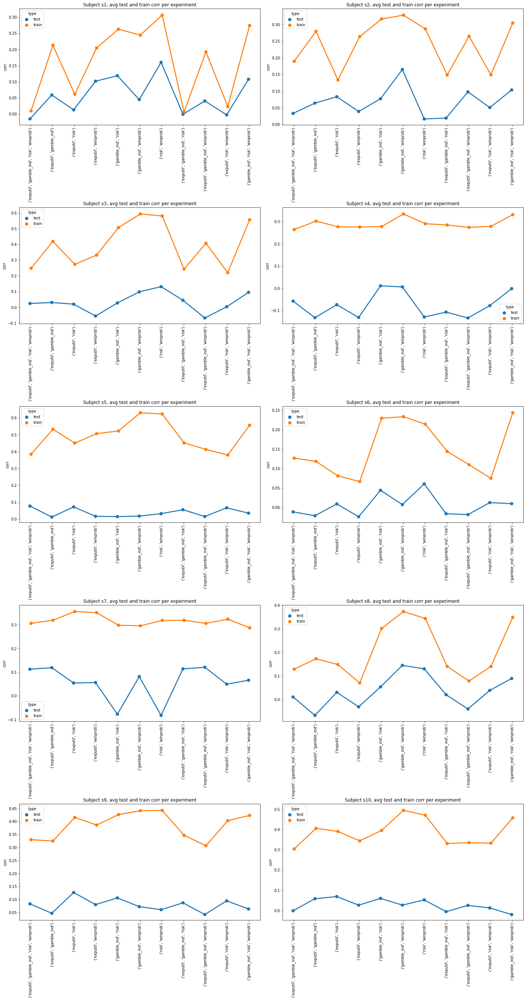

In [101]:
plot_combo_avgs_for_subject(results_gb_2)